In [1]:
import numpy as np
from matplotlib import pyplot as plt
from itertools import count
from mpl_toolkits.mplot3d import Axes3D
from scipy import optimize
import timeit

## Задание
Дана система ОДУ 1-го порядка $\frac{dx}{dt} = f(x)$, где $x = x(t) = [x(t), y(t), z(t)]^{T}$:  
$\frac{d}{dt}\begin{bmatrix}x\\y\\z\end{bmatrix} = \begin{bmatrix}\sigma(y - x)\\x(r - z) - y\\xy - bz\end{bmatrix}$, 

где $\sigma = 10$, и $b = 8/3$

## П.1
Найти аналитически все стационарные позиции заданной системы ОДУ.

### Решение
Для стационарной позиции $\frac{dx}{dt} = 0$, следовательно:  
\begin{cases}
   \sigma(y - x) = 0\\
   x(r - z) - y = 0\\
   xy - bz = 0
\end{cases}

Из первого уравнения $x = y$, учитывая это, преобразуем второе уравнение к виду $\frac{y}{x} = r - z$. Т.к. $x = y$:  
$z = r - 1$  (1)  
Подставляем в последнее уравнение:  
$xy = x^2 = y^2 = bz = b(r - 1)$  
$x = y = \pm{\sqrt{b(r - 1)}}$  (2)  

Формулы (1) и (2) представляют собой выражения нахождения стационарных позиций. В формуле (2) фигурирует знак $\pm$, что дает в конечном итоге 2 стационарные позиции. Также мы делили на x, значит надо рассмотреть ситуацию x = 0. В этом случае появляется еще одна позиция x = y = z = 0.

## П.2

Написать следующие функции, каждая из которых возвращает дискретную траекторию системы ОДУ с правой частью, заданную функцией f, начальным условием x_0, шагом по времени h и конечным временем t_n:  

∙ euler(x_0, t_n, f, h), где дискретная траектория строится с помощью метода Эйлера;  
∙ implicit_euler(x_0, t_n, f, h), где дискретная траектория строится с помощью неявного метода Эйлера;   
∙ adams_bashforth_moulton(x_0, t_n, f, h), где дискретная траектория строится с помощью метода Адамса–Башфорта–Моултона 4-го порядка

In [2]:
def get_f(sigma: float, b: float, r: float) -> np.ndarray:
    """
    Construct vector-function
    Args:
        sigma (float): sigma parameter for the Lorentz model
        b (float): b parameter for the Lorentz model
        r (float): r parameter for the Lorentz model
    Returns:
        np.ndarray: vector-function
    """
    return lambda t, x: np.array([
        # sigma (y - x)
        sigma * (x[1] - x[0]),
        # x (r - z) - y
        x[0] * (r - x[2]) - x[1],
        # xy - bz
        x[0] * x[1] - b * x[2]
    ])

def euler(x_0: np.ndarray, t_n: float, f: np.ndarray, h: float) -> np.ndarray:
    """ 
    Implementation of the Euler Method
    Args:
        x_0 (np.ndarray): starting point
        t_n (float): simulation duration
        f (np.ndarray): functions vector: f(t, X(t))
        h (float): time step
    Returns:
        list: trajectory list
    """
    result = [x_0]
    wi = x_0

    t = np.arange(0, t_n, h)
    for t_i in t:
        wi = wi + h* f(t_i, wi)
        result.append(wi)
    return np.array(result)

def implicit_euler(x_0: np.ndarray, t_n: float, f: np.ndarray, h: float) -> np.ndarray:
    """ 
    Implementation of the Implicit Euler Method
    Args:
        x_0 (np.ndarray): starting point
        t_n (float): simulation duration
        f (np.ndarray): functions vector f(t, X(t))
        h (float): time step
    Returns:
        list: trajectory list
    """
    step_cnt = int(t_n / h)
    t = np.linspace(0, step_cnt * h, step_cnt + 1)
    result = np.zeros((step_cnt + 1, x_0.shape[0]))
    result[0] = x_0
    
    def opt_func(root, t_i, x_i):
        return root - h * f(t_i, root) - x_i
    
    for i in range(t.shape[0] - 1):
        result[i + 1] = optimize.root(opt_func, result[i], args=(t[i], result[i])).x
            
    return result

def adams_bashforth_moulton(x_0: np.ndarray, t_n: float, f: np.ndarray, h: float) -> np.ndarray:
    """ 
    Implementation of the Adams-Bashforth-Moulton 4 order Method
    Args:
        x_0 (np.ndarray): starting point
        t_n (float): simulation duration
        f (np.ndarray): functions vector f(t, X(t))
        h (float): time step
    Returns:
        list: trajectory list
    """
    ORDER = 4
    PRED_COEFS = [55.0, -59.0, 37.0, -9.0]
    CORR_COEFS = [9.0, 19.0, -5.0, 1.0]

    step_cnt = int(t_n / h)
    t = np.linspace(h * ORDER, step_cnt * h, step_cnt + 1)
    result = np.zeros((step_cnt + 1, x_0.shape[0]))
    
    start_x = implicit_euler(x_0, h * (ORDER - 1), f, h)
    for i in range(ORDER):
        result[i] = start_x[i]
        
    for i in range(ORDER, t.shape[0]):
        pred = result[i - 1]
        # Predictor
        for j in range(ORDER):
            pred += h * PRED_COEFS[j] * f(t[i], result[i - 1 - j]) / 24.0
        result[i] = pred
        corr = result[i - 1]
        # Corrector
        for j in range(ORDER):
            corr += h * CORR_COEFS[j] * f(t[i], result[i - j]) / 24.0
        result[i] = corr
    return result
    
    

In [3]:
def plot_once(result_arr):
    result_arr = result_arr.T
    _, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 6), dpi=400, subplot_kw={'projection': '3d'})
    axes.set_xlabel('x')
    axes.set_ylabel('y')
    axes.set_zlabel('z')
    axes.plot(result_arr[0], result_arr[1], result_arr[2], linewidth=0.5)
    plt.show()

In [4]:
# Протестируем полученные функции
sigma = 10.0
b = 8.0 / 3.0
r = 28

f = get_f(sigma, b, r)
x_0 = np.array([1.0, 1.0, 1.0])

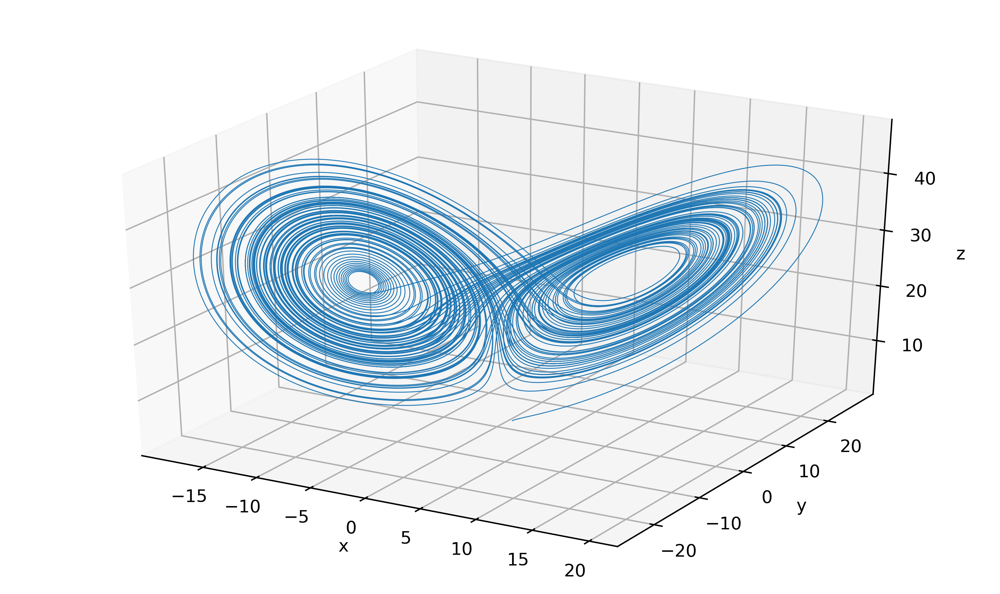

In [5]:
# Пример запуска для явного Эйлера
result = euler(x_0, 100.0, f, 0.001)
plot_once(result)

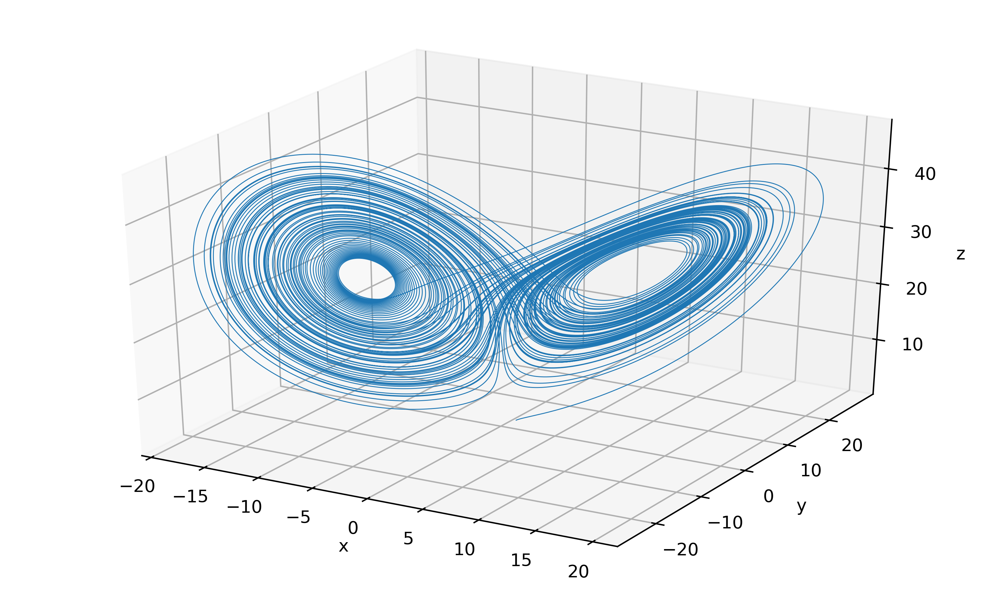

In [6]:
# Пример запуска для неявного Эйлера
result = implicit_euler(x_0, 100.0, f, 0.001)
plot_once(result)

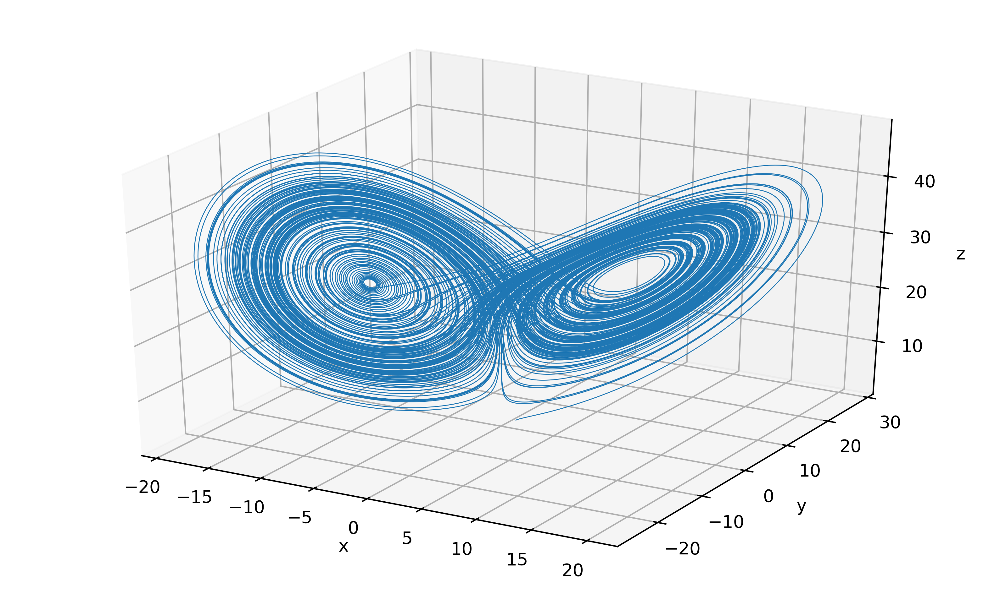

In [7]:
# Пример запуска для Адамса-Башфорта-Моултона 4 порядка
result = adams_bashforth_moulton(x_0, 100.0, f, 0.001)
plot_once(result)

## П. 3
Выбрать “численный метод по умолчанию” из функций euler, implicit_euler и adams_bashforth_moulton и “шаг по умолчанию” ℎ, предполагая, что ваш выбор даст наиболее точное решение. Аргументируйте свой выбор

В качестве численного метода по умолчанию выбираем метод Адамса-Башфорта-Моултона 4-го порядка, т.к. он имеет глобальную погрешность
порядка $O(h^4)$, в отличие от методов Эйлера. Также методы построенные по схеме предиктор-корректор сочетают в себе плюсы явных и неявных методов: обладают лучшей вычислительной устойчивостью, чем явные методы, проще в вычислении, чем неявные.  

Шаг возьмем равным 0.001, интервал моделирования от 0 до 40 - это позволит за адекватное время получить наглядные результаты.

In [8]:
sigma = 10.0
b = 8.0 / 3.0

default_method = adams_bashforth_moulton
default_step = 0.001
default_t_n = 40.0

## П. 4
Для каждого из значений параметра r ∈ {0,10,20,30} провести следующий анализ:

#### a)
Cгенерировать набор случайных начальных условий ${(x_{i}, y_{i}, z_{i})}_{i=1}^{100}$

In [9]:
SHAPE = (15, 1)
x_vec = np.random.uniform(-50, 50, SHAPE)
y_vec = np.random.uniform(-50, 50, SHAPE)
z_vec = np.random.uniform(0, 70, SHAPE)

x_0_vec = np.concatenate((x_vec, y_vec, z_vec), axis=1)

#### b)
Для каждого случайного начального условия следует найти решение данной системы ОДУ с помощью численного метода по умолчанию
#### c)
Вывести подмножество полученных траекторий на одном графике в виде фазового портрета

In [10]:
# HINT: выполнение этой функции может занимать довольно длительное время (особенно на таких слабых
# ноутбуках, как у меня) поэтому если не уверены в своих действиях, не трогайте ячейки с solve. Для перестроения графиков
# логика специально вынесена в отдельную функцию
def solve(x_0_vec, r):
    f = get_f(sigma, b, r)
    return np.apply_along_axis(lambda x_0: default_method(x_0, default_t_n, f, default_step), 1, x_0_vec)

def plot(results):
    _, axes = plt.subplots(nrows=1, ncols=1, figsize=(10, 6), dpi=400, subplot_kw={'projection': '3d'})
    axes.set_xlabel('x')
    axes.set_ylabel('y')
    axes.set_zlabel('z')
    # Out only 15 praphs
    GRAPHS_CNT = 15 if results.shape[0] > 10 else results.shape[0]
    for i in range(GRAPHS_CNT):
        solution = results[i]
        solution = solution.T
        axes.plot(solution[0], solution[1], solution[2], linewidth=0.5)
    plt.show()

In [11]:
# Перезапускать только при надобности
res0 = solve(x_0_vec, 0.0)

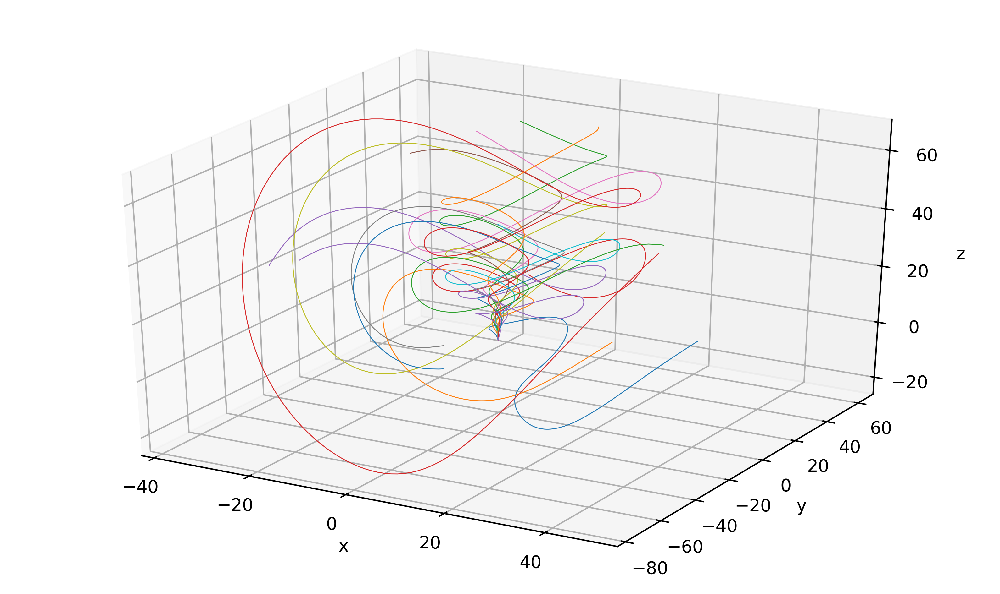

In [12]:
plot(res0)

Аттрактор - начало координат (0; 0; 0)

In [13]:
# Перезапускать только при надобности
res1 = solve(x_0_vec, 10.0)

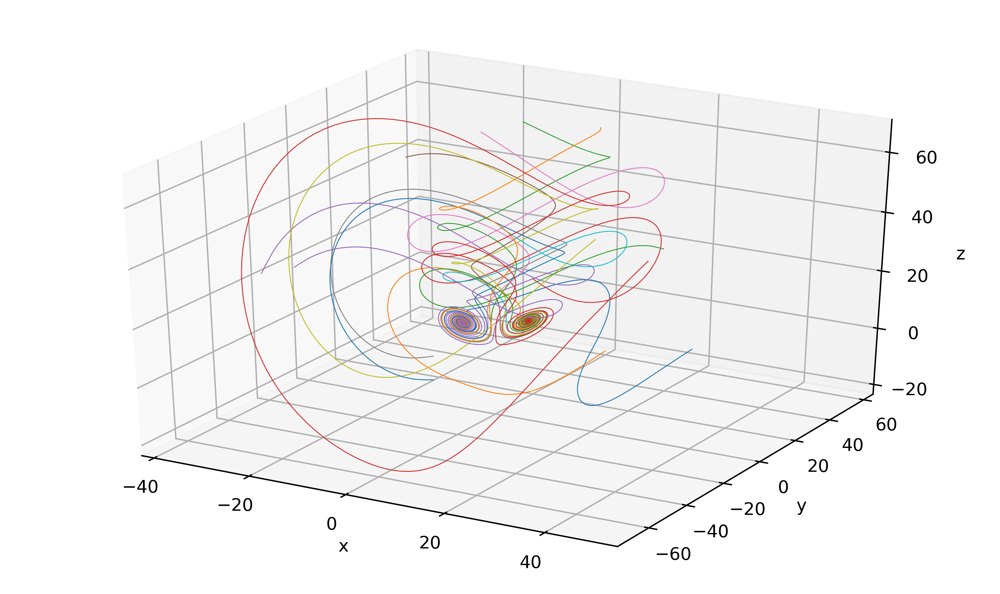

In [14]:
plot(res1)

In [15]:
# Перезапускать только при надобности
res2 = solve(x_0_vec, 20.0)

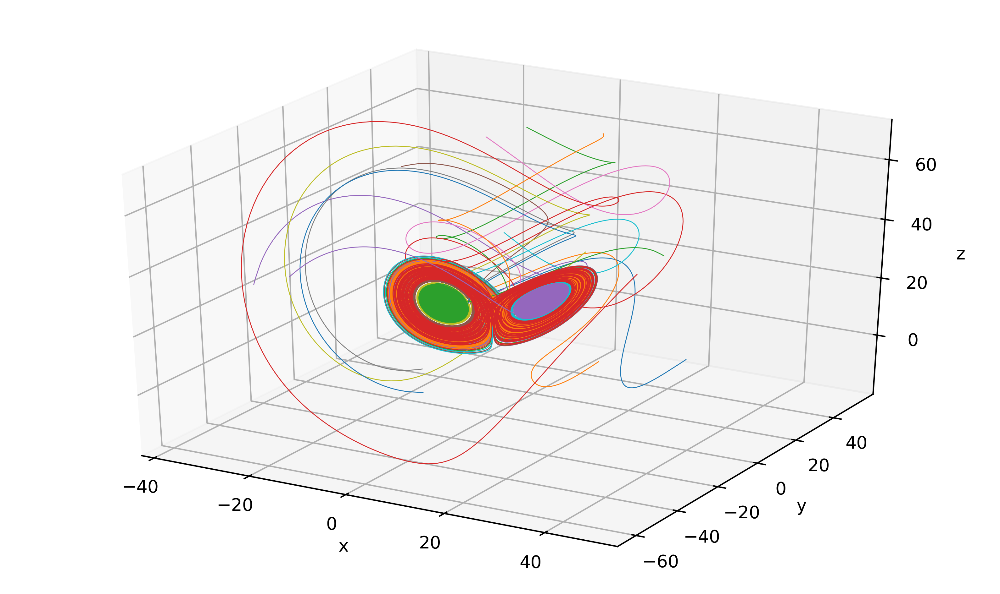

In [16]:
plot(res2)

In [17]:
# Перезапускать только при надобности
res3 = solve(x_0_vec, 28.0)

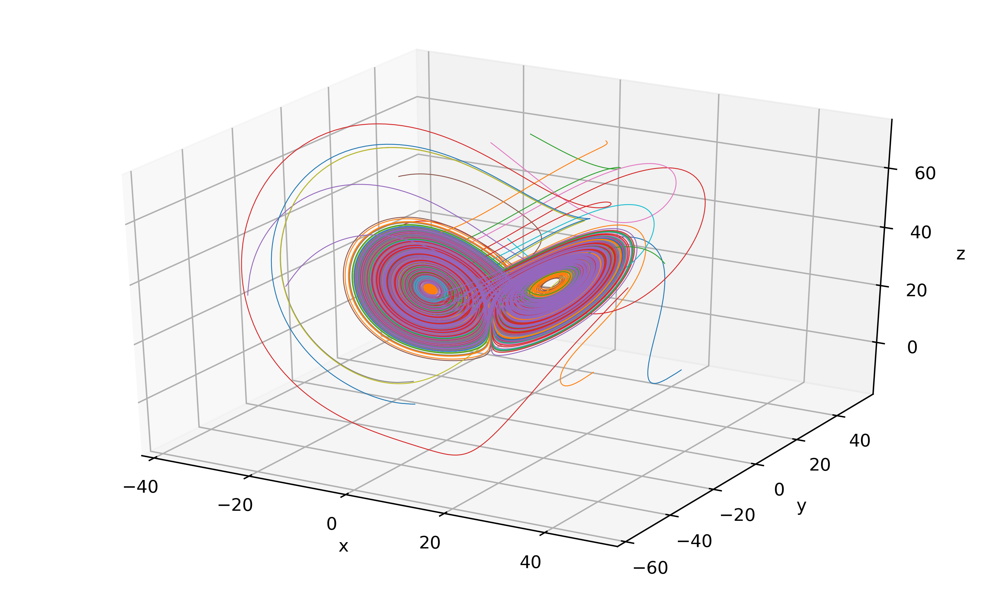

In [18]:
plot(res3)

In [19]:
# Перезапускать только при надобности
res3 = solve(x_0_vec, 30.0)

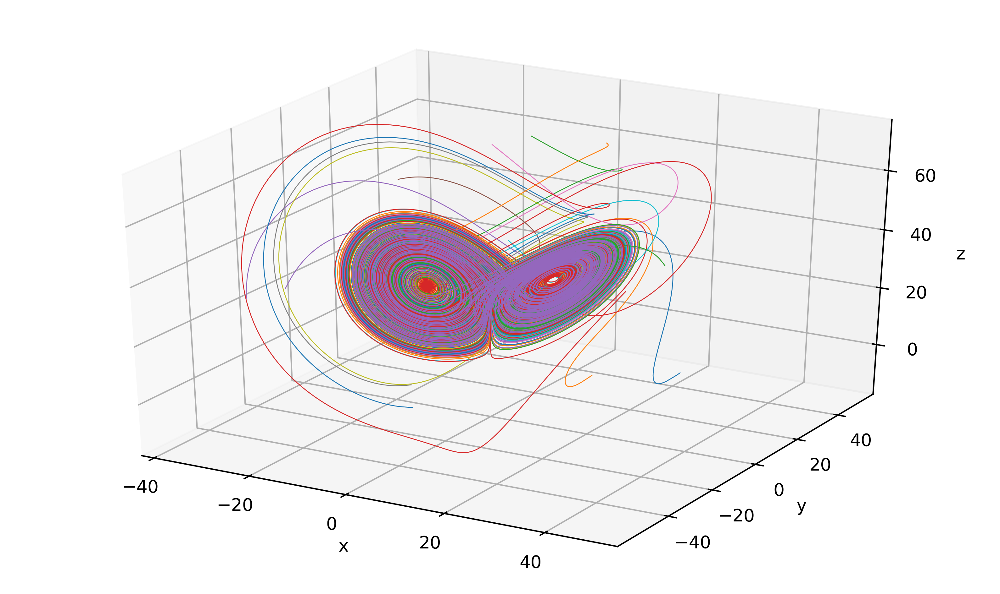

In [20]:
plot(res3)